# Preparing our Data

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

pd.options.mode.copy_on_write = True

In [2]:
ccc = pd.read_csv('../data/ccc_compiled.csv', encoding='latin1')
finance = pd.read_csv('../data/DATA.csv')
news = pd.read_csv('../data/headlines.csv')

In [3]:
ccc.head(5)

,Date,CityTown,StateTerritory,Location,LocationDetail,County,Online,EventType,MacroEvent,Actor,...,ReportedPropertyDamage,TownsCities,Events,Source1,Source2,Source3,Misc,Final,lat,lon
0,2017-01-21,Adak,AK,"Adak, AK",NaN,Aleutians West Census Area,0.0,march,"Women's March (January 21, 2017)",NaN,...,NaN,1.0,NaN,adn.com,NaN,NaN,NaN,1,51.880000,-176.658056
1,2017-01-21,Anchorage,AK,"Anchorage, AK",NaN,NaN,0.0,march,"Women's March (January 21, 2017)",NaN,...,NaN,1.0,NaN,https://www.adn.com/alaska-news/2017/01/21/lar...,https://twitter.com/julia_omalley/status/82290...,http://www.ktuu.com/content/news/Thousands-of-...,NaN,1,61.218056,-149.900278
2,2017-01-21,Bethel,AK,"Bethel, AK",NaN,Bethel Census Area,0.0,march,"Women's March (January 21, 2017)",NaN,...,NaN,1.0,NaN,https://www.adn.com/slideshow/visual/2017/01/2...,http://kyuk.org/post/slideshow-bethel-proteste...,https://jackpineradicals.com/boards/topic/wome...,NaN,1,60.792222,-161.755833
3,2017-01-21,Cordova,AK,"Cordova, AK",NaN,Valdez-Cordova Census Area,0.0,march,"Women's March (January 21, 2017)",NaN,...,NaN,1.0,NaN,onsite eyewitness who did headcount,NaN,NaN,NaN,1,60.542409,-145.752541
4,2017-01-21,Fairbanks,AK,"Fairbanks, AK",NaN,Fairbanks North Star Borough,0.0,march,"Women's March (January 21, 2017)",NaN,...,NaN,1.0,NaN,http://www.newsminer.com/news/local_news/gathe...,NaN,NaN,NaN,1,64.837778,-147.716389


In [4]:
finance.head(5)

,DATE,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA
0,01-05-2022,3.6,106.4,352.857,123.322800,8.581511,5.2300,NaN,4.13,8.4,NaN,74737,19699.465,-0.144227,120.724
1,01-04-2022,3.6,107.3,343.730,121.978170,8.258629,4.9825,NaN,3.76,8.4,NaN,74737,19699.465,-0.144227,121.813
2,01-03-2022,3.6,107.2,345.852,121.301004,8.542456,4.1720,NaN,3.43,7.0,NaN,73289,19727.918,-0.395692,122.888
3,01-02-2022,3.8,110.5,343.583,119.702806,7.871064,3.7625,NaN,3.25,6.0,NaN,73289,19727.918,-0.395692,123.831
4,01-01-2022,4.0,113.8,345.742,118.619339,7.479872,3.4450,NaN,2.93,5.7,NaN,73289,19727.918,-0.395692,124.780


In [5]:
news.head(5)

,Date,Publication,Headline,URL
0,20070101,New York Times,Rush to Hang Hussein Was Questioned,http://www.nytimes.com/2007/01/01/world/middle...
1,20070101,New York Times,"News Analysis: For Sunnis, Dictators End Is O...",http://www.nytimes.com/2007/01/01/world/middle...
2,20070101,New York Times,Hard Choices Over Video,http://www.nytimes.com/2007/01/01/world/middle...
3,20070101,New York Times,States Take Lead on Ethics Rules for Lawmakers,http://www.nytimes.com/2007/01/01/us/01ethics....
4,20070101,New York Times,"Spitzer Arrives With Mandate, but Faces Challe...",http://www.nytimes.com/2007/01/01/nyregion/01e...


In [6]:
ccc.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42929 entries, 0 to 42928
Data columns (total 29 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Date                         42911 non-null  object 
 1   CityTown                     41689 non-null  object 
 2   StateTerritory               42663 non-null  object 
 3   Location                     42929 non-null  object 
 4   LocationDetail               36981 non-null  object 
 5   County                       36334 non-null  object 
 6   Online                       41673 non-null  float64
 7   EventType                    41237 non-null  object 
 8   MacroEvent                   17895 non-null  object 
 9   Actor                        40266 non-null  object 
 10  Claim                        40125 non-null  object 
 11  ClaimType                    41528 non-null  float64
 12  EstimateLow                  24595 non-null  float64
 13  EstimateHigh    

In [7]:
finance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   DATE                           241 non-null    object 
 1   UNRATE(%)                      241 non-null    float64
 2   CONSUMER CONF INDEX            241 non-null    float64
 3   PPI-CONST MAT.                 241 non-null    float64
 4   CPIALLITEMS                    241 non-null    float64
 5   INFLATION(%)                   241 non-null    float64
 6   MORTGAGE INT. MONTHLY AVG(%)   241 non-null    float64
 7   MED HOUSEHOLD INCOME           224 non-null    float64
 8   CORP. BOND YIELD(%)            241 non-null    float64
 9   MONTHLY HOME SUPPLY            241 non-null    float64
 10  % SHARE OF WORKING POPULATION  236 non-null    float64
 11  GDP PER CAPITA                 241 non-null    int64  
 12  QUARTERLY REAL GDP             241 non-null    flo

In [8]:
news.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4405397 entries, 0 to 4405396
Data columns (total 4 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   Date         int64 
 1   Publication  object
 2   Headline     object
 3   URL          object
dtypes: int64(1), object(3)
memory usage: 134.4+ MB


In [9]:
ccc = ccc[['Date', 'EventType', 'Claim', 'EstimateHigh', 'EstimateLow']]
finance = finance[['DATE', 'UNRATE(%)', 'CONSUMER CONF INDEX', 'INFLATION(%)']]
news = news[['Date', 'Headline']]

In [10]:
ccc.info()
finance.info()
news.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42929 entries, 0 to 42928
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          42911 non-null  object 
 1   EventType     41237 non-null  object 
 2   Claim         40125 non-null  object 
 3   EstimateHigh  24570 non-null  float64
 4   EstimateLow   24595 non-null  float64
dtypes: float64(2), object(3)
memory usage: 1.6+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE                 241 non-null    object 
 1   UNRATE(%)            241 non-null    float64
 2   CONSUMER CONF INDEX  241 non-null    float64
 3   INFLATION(%)         241 non-null    float64
dtypes: float64(3), object(1)
memory usage: 7.7+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4405397 entries, 0 to 4405396
Dat

### Missing values

In [11]:
ccc.isnull().sum()/len(ccc) * 100

Date             0.041930
EventType        3.941392
Claim            6.531715
EstimateHigh    42.765962
EstimateLow     42.707727
dtype: float64

In [12]:
finance.isnull().sum()/len(finance) * 100

DATE                   0.0
UNRATE(%)              0.0
CONSUMER CONF INDEX    0.0
INFLATION(%)           0.0
dtype: float64

In [13]:
news.isnull().sum()/len(news) * 100

Date        0.000000
Headline    0.998979
dtype: float64

- drop columns EstimateLow and EstimateHigh from ccc dataset since they have high null values (around 50%)
- drop rows with null Date, EventType, Claim in ccc dataset since they are few (less than 6%)
- finance is clean
- drop rows with null headlines in news dataset since they are few (around 1%)

In [14]:
ccc.drop(columns=['EstimateLow', 'EstimateHigh'], inplace=True)
ccc.dropna(subset=['Date', 'EventType', 'Claim'], inplace=True)
news.dropna(subset=['Headline'], inplace=True)

In [15]:
assert ccc.isnull().sum().sum() == 0
assert finance.isnull().sum().sum() == 0
assert news.isnull().sum().sum() == 0

### Duplicate values

In [16]:
ccc.drop_duplicates(inplace=True)
finance.drop_duplicates(inplace=True)
news.drop_duplicates(inplace=True)

In [17]:
assert ccc.duplicated().sum() == 0
assert finance.duplicated().sum() == 0
assert news.duplicated().sum() == 0

In [18]:
ccc.shape, finance.shape, news.shape

((18346, 3), (241, 4), (4349302, 2))

### Data types formatting

In [19]:
# fixe Date format
ccc['Date'] = pd.to_datetime(ccc['Date'])
finance['Date'] = pd.to_datetime(finance['DATE'], format='%d-%m-%Y')
finance.drop(columns=['DATE'], inplace=True)
# The current format is "YYYYMMDD" as a string, so specify the format explicitly
news['Date'] = pd.to_datetime(news['Date'], format='%Y%m%d')

In [20]:
# sorting by date
ccc.sort_values(by='Date', inplace=True)
finance.sort_values(by='Date', inplace=True)
news.sort_values(by='Date', inplace=True)

### Exploring Data

In [21]:
ccc['EventType'].value_counts()

EventType
protest                   8777
rally                     4455
march                      901
demonstration              363
Protest                    363
                          ... 
protest on skateboards       1
protest; camp-out            1
walk; run                    1
eviction blockade            1
car caravans                 1
Name: count, Length: 768, dtype: int64

In [22]:
# keep only rows with at least one of the following event types figuring in the 'EventType' column
ccc['EventType'] = ccc['EventType'].str.lower()
event_types_to_keep = ['protest', 'march', 'strike', 'demonstration', 'sit-in', 'die-in', 'counterprotest']
pattern = '|'.join(event_types_to_keep)
ccc = ccc[ccc['EventType'].str.contains(pattern, case=False, na=False)]
print("number of rows after filtering:", len(ccc))

number of rows after filtering: 12719


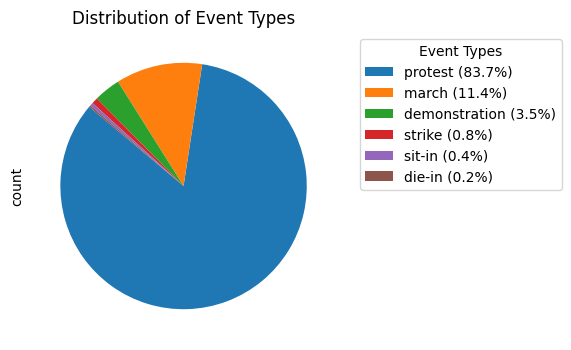

In [23]:
# replace the current values in 'EventType' column by the matched event type
def extract_event_type(event_type):
    event_type = event_type.lower()
    for et in event_types_to_keep:
        if et in event_type:
            return et
    return None
ccc['EventType'] = ccc['EventType'].apply(extract_event_type)
ccc['EventType'].value_counts().plot.pie(
    figsize=(4, 4), 
    autopct=None,  # Remove percentage labels
    startangle=140, 
    labels=['']*ccc['EventType'].nunique()  # Remove class names from pie
)
plt.title('Distribution of Event Types')
plt.legend(
    labels=ccc['EventType'].value_counts().index+' ('+(ccc['EventType'].value_counts()/ccc['EventType'].value_counts().sum()*100).round(1).astype(str)+'%)',
    title='Event Types', 
    bbox_to_anchor=(1.05, 1), 
    loc='upper left'
)
plt.show()

In [24]:
# count the number of events per day and add it as a new column 'EventCount' to ccc dataframe
event_counts = ccc['Date'].value_counts().sort_index()
ccc = ccc.merge(event_counts.rename('EventCount'), left_on='Date', right_index=True)
ccc.head(5)

,Date,EventType,Claim,EventCount
0,2017-01-21,march,Empower Voters to Support Women's Rights,1
691,2017-02-01,demonstration,trump's policies,16
690,2017-02-01,demonstration,"end the ""Muslim ban""",16
687,2017-02-01,march,Immigration ban,16
686,2017-02-01,protest,protest immigration ban,16


In [25]:
# group by date to have one row per date in ccc
ccc_daily = ccc.groupby('Date').agg({'EventCount': 'mean'}).reset_index()
ccc_daily.head(5)

,Date,EventCount
0,2017-01-21,1.0
1,2017-02-01,16.0
2,2017-02-02,11.0
3,2017-02-03,12.0
4,2017-02-04,21.0


### Merging Datasets

We will unify the time frequency of our datasets to monthly data since the finance data is monthly. (smallest frequency)

We will find the intersection of the date ranges of the 3 datasets to have a common date range for all datasets.

In [26]:
# get first and last date in each dataframe
print('CCC date range:\t\t', ccc_daily['Date'].min().strftime('%Y-%m-%d'), 'to', ccc_daily['Date'].max().strftime('%Y-%m-%d'))
print('Finance date range:\t', finance['Date'].min().strftime('%Y-%m-%d'), 'to', finance['Date'].max().strftime('%Y-%m-%d'))
print('News date range:\t', news['Date'].min().strftime('%Y-%m-%d'), 'to', news['Date'].max().strftime('%Y-%m-%d'))

CCC date range:		 2017-01-21 to 2020-09-10
Finance date range:	 2002-05-01 to 2022-05-01
News date range:	 2007-01-01 to 2023-01-01


In [27]:
# latest and earliest date common to all dataframes
latest_date = min(ccc_daily['Date'].max(), finance['Date'].max(), news['Date'].max())
earliest_date = max(ccc_daily['Date'].min(), finance['Date'].min(), news['Date'].min())
print('Common date range:\t', earliest_date.strftime('%Y-%m-%d'), 'to', latest_date.strftime('%Y-%m-%d'))

Common date range:	 2017-01-21 to 2020-09-10


In [28]:
# crop dataframes to the common date range
ccc_daily_crop = ccc_daily[(ccc_daily['Date'] >= earliest_date) & (ccc_daily['Date'] <= latest_date)]
finance_crop = finance[(finance['Date'] >= earliest_date) & (finance['Date'] <= latest_date)]
news_crop = news[(news['Date'] >= earliest_date) & (news['Date'] <= latest_date)]

# reset index
ccc_daily_crop.reset_index(drop=True, inplace=True)
finance_crop.reset_index(drop=True, inplace=True)
news_crop.reset_index(drop=True, inplace=True)

In [29]:
finance_crop.shape, news_crop.shape, ccc_daily_crop.shape

((44, 4), (1021271, 2), (1231, 2))

In [30]:
finance_crop.sort_values(by='Date', inplace=True)
ccc_daily_crop.sort_values(by='Date', inplace=True)
news_crop.sort_values(by='Date', inplace=True)

In [31]:
# aggregate ccc monthly
ccc_monthly_crop = ccc_daily_crop.resample('ME', on='Date').sum().reset_index()
# keep only month in Date column
ccc_monthly_crop['Date'] = ccc_monthly_crop['Date'].dt.to_period('M').dt.to_timestamp()
ccc_monthly_crop.head(5)

,Date,EventCount
0,2017-01-01,1.0
1,2017-02-01,359.0
2,2017-03-01,307.0
3,2017-04-01,273.0
4,2017-05-01,371.0


In [34]:
# aggregate news by date and concatenate headlines
news_daily_crop = news_crop.groupby('Date').agg({'Headline': '|'.join}).reset_index()
# aggregate news monthly
news_monthly_crop = news_daily_crop.resample('ME', on='Date').agg({'Headline': '|'.join}).reset_index()
# keep only month in Date column
news_monthly_crop['Date'] = news_monthly_crop['Date'].dt.to_period('M').dt.to_timestamp()
news_monthly_crop.head(5)

,Date,Headline
0,2017-01-01,255 comments|‘We’re Not Going Away’: Huge Crow...
1,2017-02-01,Our Supreme Court Reporter on Gorsuch’s Record...
2,2017-03-01,5 Takeaways From President Trump’s Speech to C...
3,2017-04-01,Jayson Werth makes obscene gesture on air but ...
4,2017-05-01,Fresh Shake-Up Rattles Fox News: Co-President ...


In [35]:
ccc_monthly_crop.shape, finance_crop.shape, news_monthly_crop.shape

((45, 2), (44, 4), (45, 2))

In [71]:
# merge dataframes on 'Date' column
merged_df = ccc_monthly_crop.merge(finance_crop, on='Date').merge(news_monthly_crop, on='Date')
merged_df.head(5)

,Date,EventCount,UNRATE(%),CONSUMER CONF INDEX,INFLATION(%),Headline
0,2017-02-01,359.0,4.6,114.8,2.737958,Our Supreme Court Reporter on Gorsuch’s Record...
1,2017-03-01,307.0,4.4,125.6,2.380612,5 Takeaways From President Trump’s Speech to C...
2,2017-04-01,273.0,4.4,120.3,2.199690,Jayson Werth makes obscene gesture on air but ...
3,2017-05-01,371.0,4.4,117.9,1.874878,Fresh Shake-Up Rattles Fox News: Co-President ...
4,2017-06-01,304.0,4.3,118.9,1.633488,"Comey Is Expected to Testify, if He Isn’t Bloc..."


### Data visualization

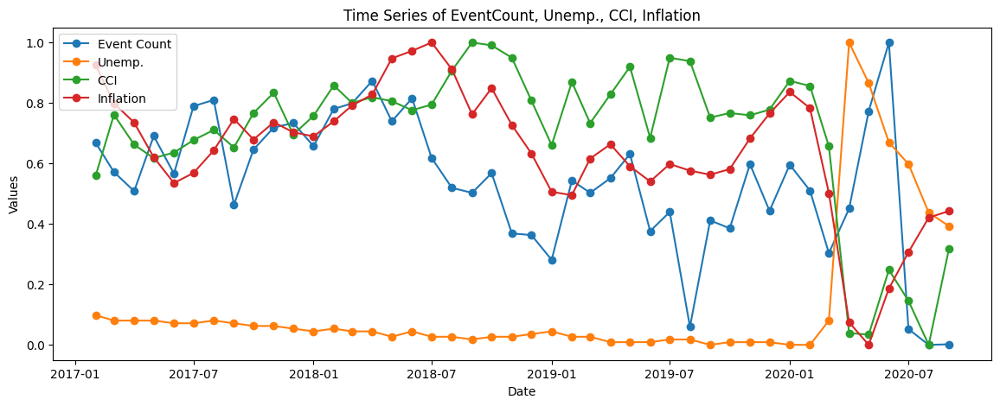

In [ ]:
# plot time series of EventCount, UNRATE(%), CONSUMER CONF INDEX, INFLATION(%)
# normalize the data for better visualization
scaler = MinMaxScaler()

merged_std_df = merged_df.copy()
merged_std_df[['EventCount', 'UNRATE(%)', 'CONSUMER CONF INDEX', 'INFLATION(%)']] = scaler.fit_transform(merged_df[['EventCount', 'UNRATE(%)', 'CONSUMER CONF INDEX', 'INFLATION(%)']]) 
# change columns names to shorter ones
merged_std_df.rename(columns={'UNRATE(%)': 'Unemp', 'CONSUMER CONF INDEX': 'CCI', 'INFLATION(%)': 'Inflation'}, inplace=True)

plt.figure(figsize=(14, 5))
plt.plot(merged_std_df['Date'], merged_std_df['EventCount'], label='Event Count', marker='o')
plt.plot(merged_std_df['Date'], merged_std_df['Unemp'], label='Unemp.', marker='o')
plt.plot(merged_std_df['Date'], merged_std_df['CCI'], label='CCI', marker='o')
plt.plot(merged_std_df['Date'], merged_std_df['Inflation'], label='Inflation', marker='o')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Time Series of EventCount, Unemp., CCI, Inflation')
plt.legend()
plt.show()

### Correlation Analysis

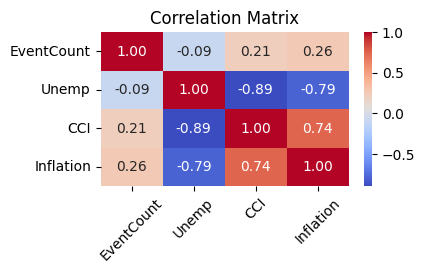

In [73]:
# correlation matrix
corr = merged_std_df[['EventCount', 'Unemp', 'CCI', 'Inflation']].corr()
plt.figure(figsize=(4, 2))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
# rotate x labels
plt.xticks(rotation=45)
plt.title('Correlation Matrix')
plt.show()

### Text Analysis

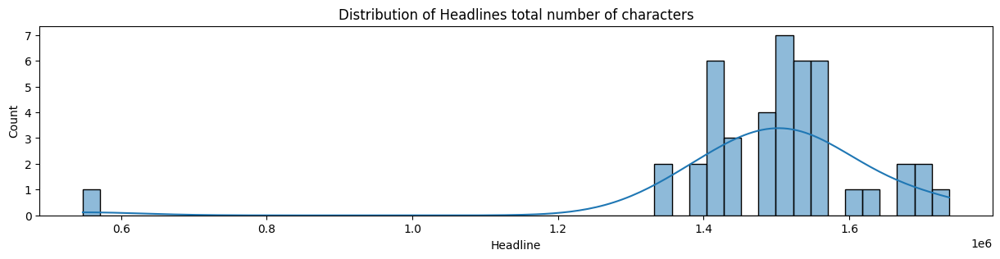

In [75]:
# plot distribution of headline number of characters 
headline_lengths = merged_std_df['Headline'].apply(len)
plt.figure(figsize=(15, 3))
sns.histplot(headline_lengths, bins=50, kde=True)
plt.title('Distribution of Headlines total number of characters')
plt.show()

### Save cleaned datasets to csv files for future use

In [79]:
# save merged_std_df and merged_df to csv
merged_std_df.to_csv('../data/merged_std_data.csv', index=False)
merged_df.to_csv('../data/merged_data.csv', index=False)